# **1. Python 🐍 for Data Visualization 📈 in Power BI**

---

By Jean-Yves Tran | jy.tran@[datascience-jy.com](https://datascience-jy.com) | [LinkedIn](https://www.linkedin.com/in/jytran-datascience/)  
IBM Certified Data Analyst 

---

Source: 
- [Power BI Masterclass 8 -Python, Finance, and Advanced DAX](https://www.packtpub.com/product/power-bi-masterclass-8-python-finance-and-advanced-dax-video/9781835085400) - by Dan We - Packt Publishing
- [Python 3.12 Official Docs](https://docs.python.org/3/)
---

The interactive links in this notebook are not working due to GitHub limitations. View this notebook with the interactive links working [here](https://nbviewer.org/github/jendives2000/Data_ML_Practice_2025/blob/main/0_Python/practice/OOP/notebooks/oop_python_monster_slash.ipynb).

---

This is a practice project where I introduce the use of Python within Power BI and also some basic functions of Power BI to prepare a dataset before dashboarding it with a simple Slicer filter. 

- **HOW TO READ THIS:**  
  Open your own Power BI and follow me along. Lots of screenshots and also gifs to help you see what steps are to be done.  


- **HOW TO USE THIS:**  
  You will need a copy of the dataset (in the folder data_source). 
  The rest is described so just read it through. 
  Just keep in mind that whatever Python code you write within Power BI, that code is based on the environment in which you installed modules and libraries you are using in that code. So make sure you use the same environment every time, otherwise you may end up reinstalling modules in additional environments by mistake. 

  You can install all dependencies via the requirements.txt file of the `./power_bi` folder.
  

For this notebook, I will:

<u>**OUTLINE 📃:**</u>  
This notebook is made of 2 main parts:  
- the data preparation, up until [setting up Python](#setting-up-python):
  - I do everything needed so that I have all the data ready and available for scripting and visualization
- Python scripting for Visualizations:
  - I code Python and use Power BI to render visualizations the way I want

<u>**The main takeaways:** 🎯</u>  

- The Python script feature within Power BI bridges your python notebooks, models, and any other analysis performed in a python-based media, which saves time. Your work can be easily copied and pasted as is, and ready to be translated into a dashboard. 
- Actually even transforming or loading data is available, as long as it is possibly done with Python, it can be too in Power BI. 



---


# **Preparing the Data**: 

## **Loading it**:
The data is an excel sheet with data from employees and suppliers of a company. 

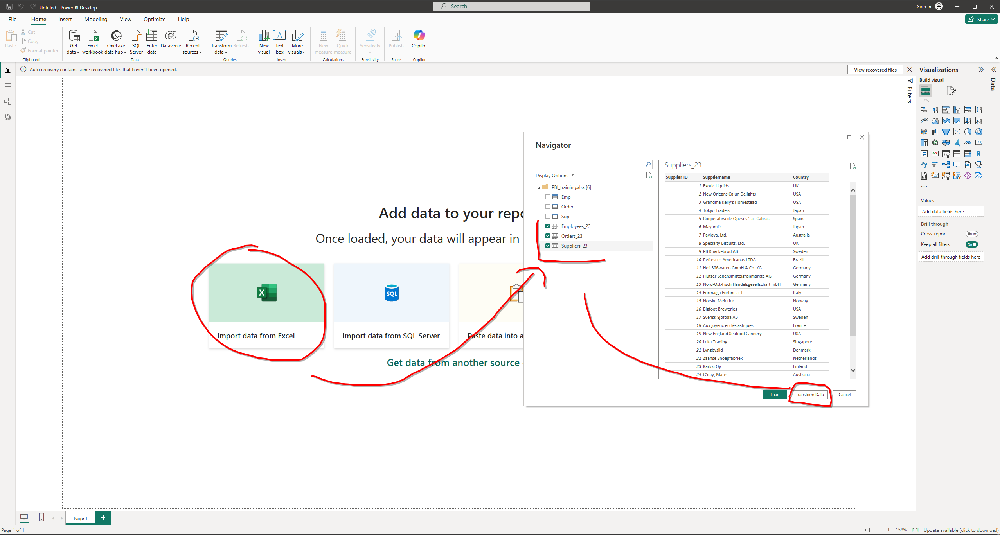

I selected the 3 tables I wanted and clicked 'Transform Data'. 

From there I will start to review the data itself and correct some mistakes or maybe missing data. 

## **Basic changes**:

My tables' names could be better: 

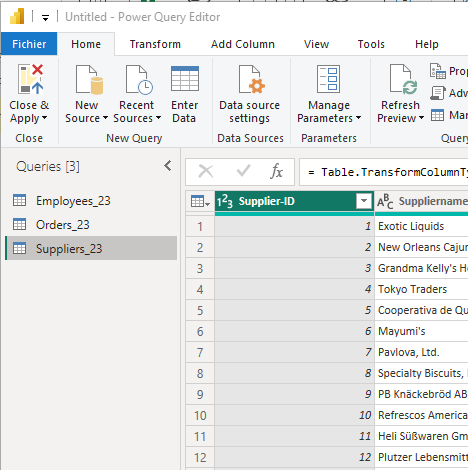

I'm changing them so that they have the tail '_tbl', which stands for table.  

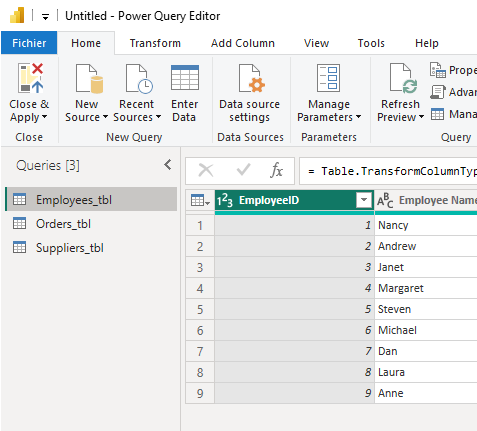

## **Spelling mistakes and/or inconsistencies?**

It is often the case that:
- some **spelling mistakes** were still persisting in the dataset, 
- and/or sometimes the words used from one table to another are **inconsistent**.  

I did **not find such mistakes** or inconsistencies in the 3 tables but one example of such inconsistencies could be as follow:  
The category country has USA as one country. One inconsistency could be that in another table it was written as 'US', or 'U.S.A' or even 'usa'. If so, I need to decide on one spelling, say 'USA' and change every misspelled instance accordingly. 

## **Data types**: 

In the header of each table, I can see what is the type of the values of each column: 

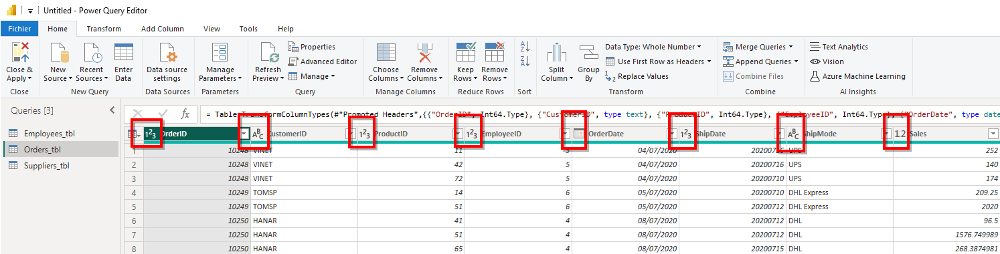

I can see 4 different types of data: 
- 123 is **Integer** type
- ABC is **Text (VARCHAR)**
- 1.2 is **Float**
- The agenda icon (like this 📅) is a **Date** type

What is important is that they are **coherent from one table to the other**.  
For example, I see the Supplier-ID column type in that same `Orders_tbl` table is 123 for Integer:  

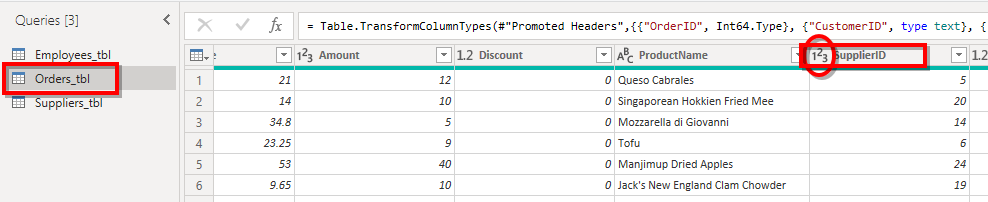

And I know that it is linked to the same column in the table `Suppliers_tbl`, which has to also be of type Integer, which is the case here. 

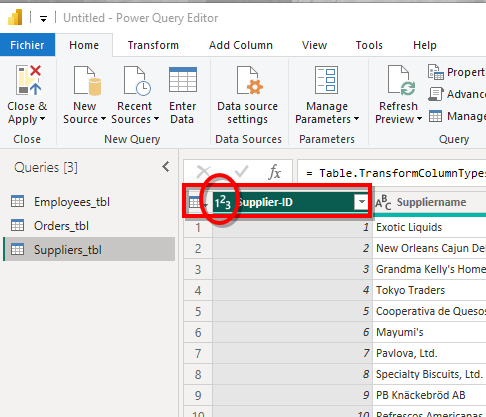

Continuing with data types I noticed that the `ShipDate` column type is an Integer BUT it should **obviously be a date**: 

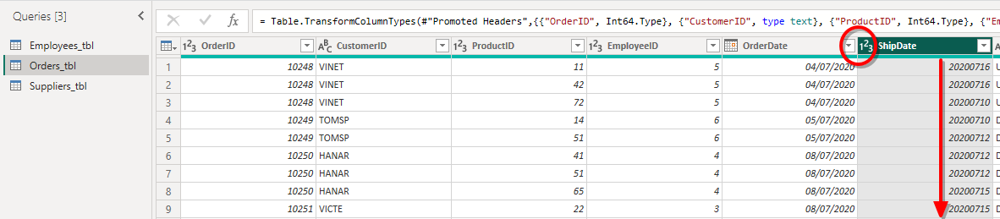

So I click on the 123 there and select Date: 

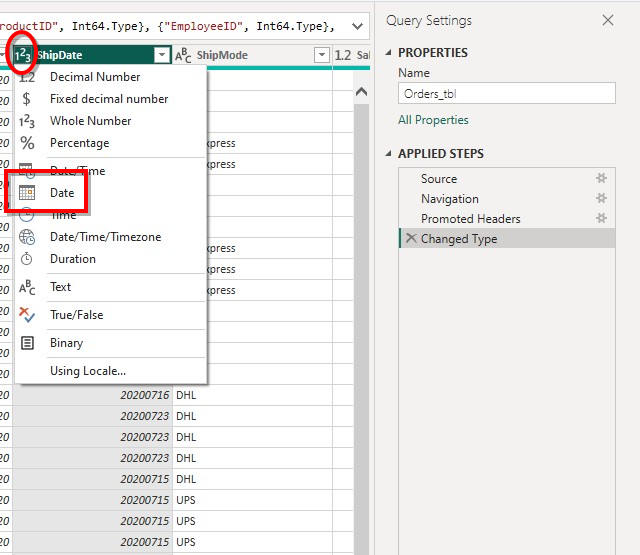

I am then prompted, asked if I want to replace a step or create a new one.  
I don't have any reasons to replace the last step, unless there are too many, so I just add a new step, it will **help me revert** that action if I need too:  

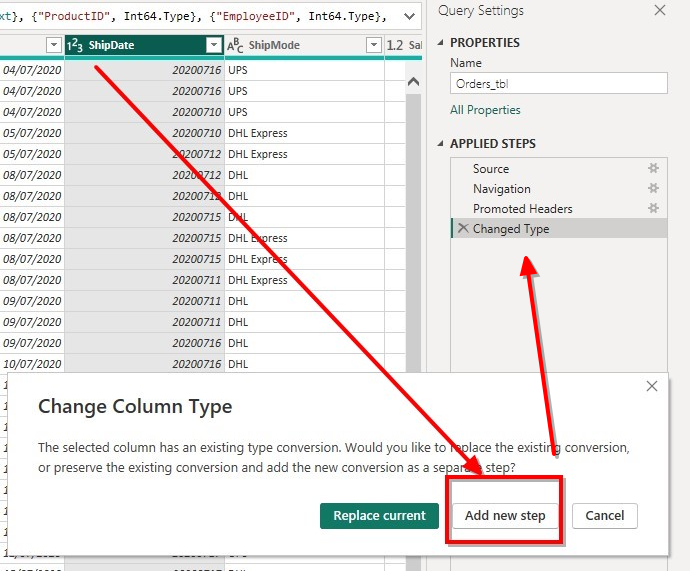
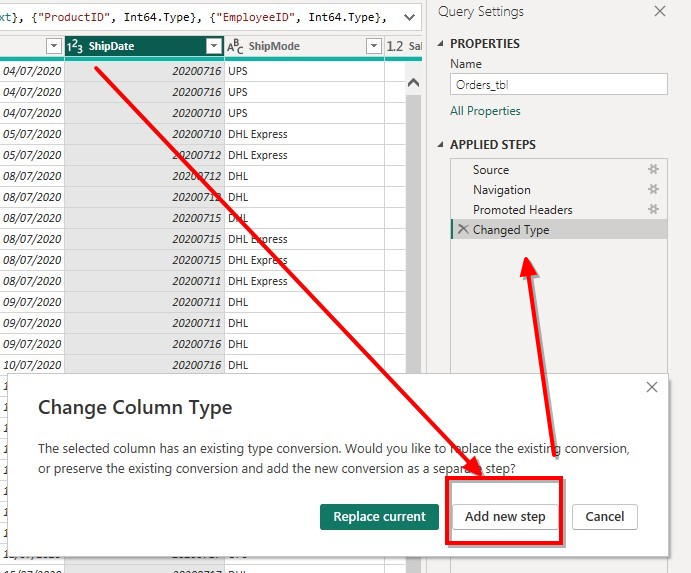

Power BI works it fast and gives me back a line of error values in the whole column. The new step was added too: 

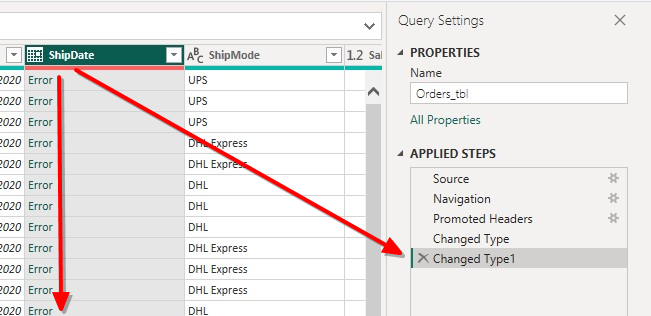

That new step comes handy now, I can click the cross at its left side to revert the action.  

But instead of clicking the Date type, I:
- first have to change it to Text type, 
- and then use the **locale setting** that allows me to have a date according to my **own local time zone**: 

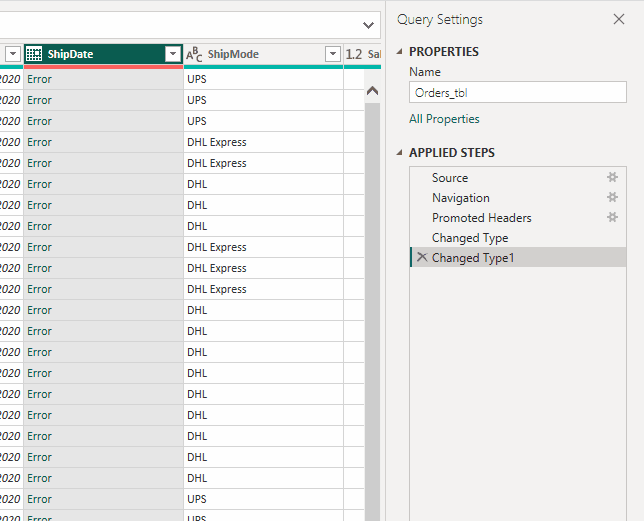

## **Missing Data**:
I continue to inspect the columns by sliding to the right side of this dataset sheet.    
It is important to really **pay attention** because Power BI does tell us, very discreetly, which column is missing data: 

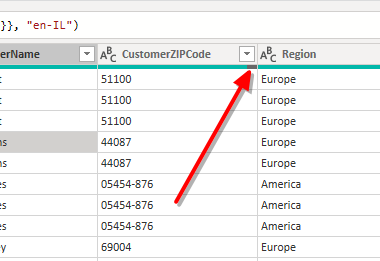

That tiny little darker side hyphen is the tell. To have a better way to check that I can just **activate the 'column quality'** setting in the view tab, and see that there is 3% of the values missing:  

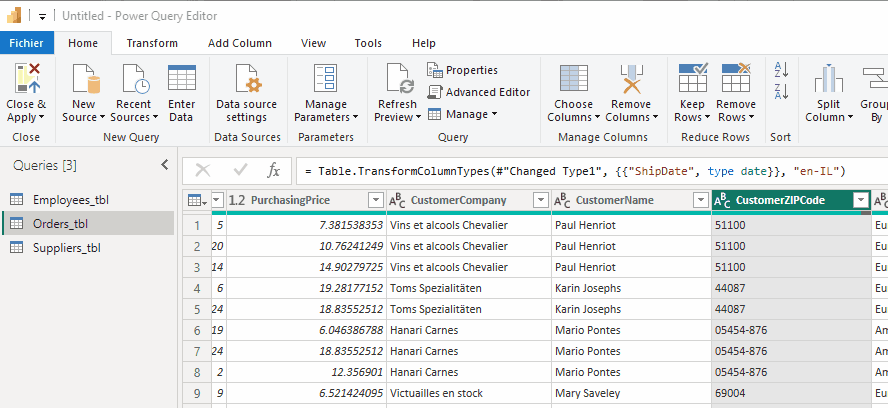

I can filter the values via the little filter icon on the right side of the column name and select all the 'null' values to see which clients are concerned.  

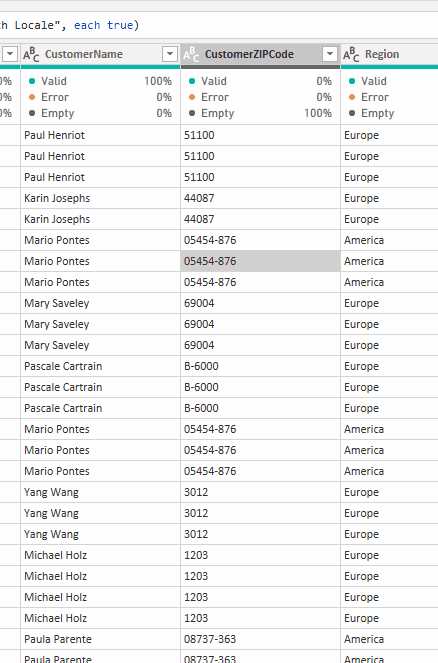

In this case it concerns only one client.  
In real life I can easily just go to the person who can get that missing address and get it from that person. 
But for now this is not a problem for me and so I am not doing anything about it.  


## **A proper Time Table**: 

For Power BI to perform as intended on time data it is best practice to **create a time table according to your needs**.  

I want to have specific dates of the OrderDate column. The filter icon gives a whole list of dates, from I can tell the dates range is from 04/07/2020 to 08/08/2021: 

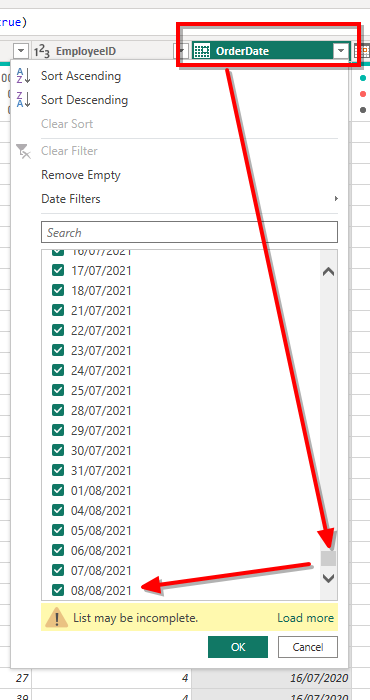


### **M code**:
M code is code written in M, which is specific to Power BI. It can add UI features and this is why I am using it here. 

For that I need first to make a `blank query`: 

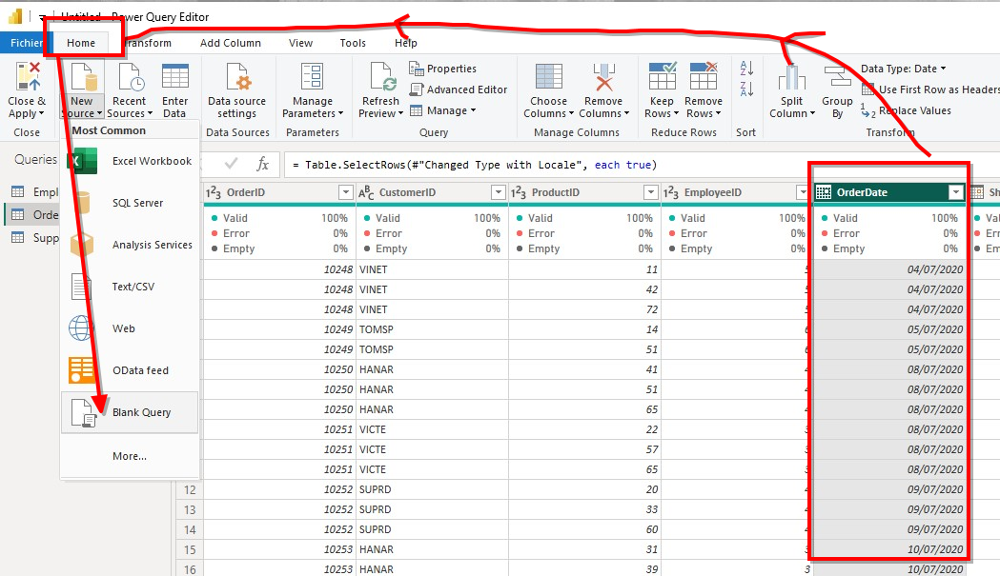

This query gives me the ability to enter an M code that will facilitate the selection of the date range I want.  

**NOTE:**
That M code was given to me. You can find it [here in this link](https://github.com/PacktPublishing/Power-BI-Masterclass---Python-Finance-and-Advanced-DAX/blob/99b7b76b3812bf6f1710b5385b00014f23df0057/resources/resources/CourseResources/Dates%20table%20M%20code.txt).

Then I need to access the Advanced Editor where I can paste the code:  

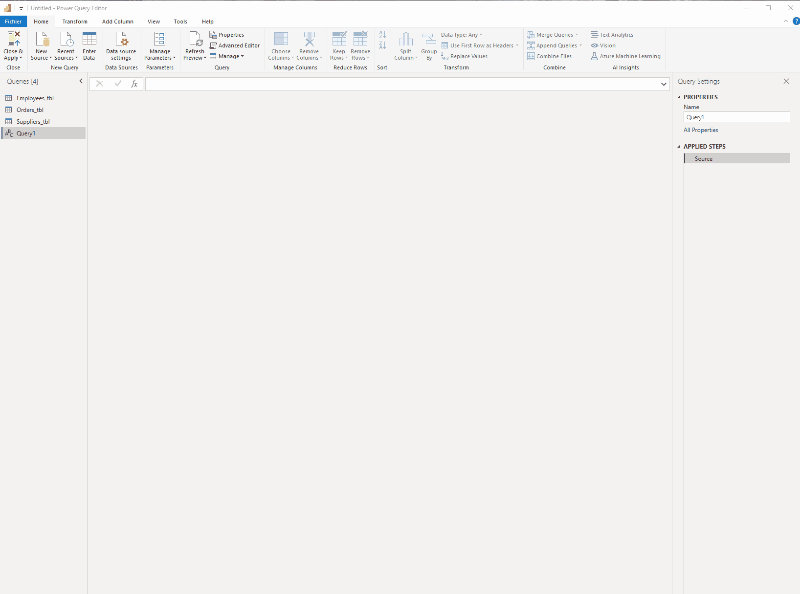


For the dates I want the ones you see down there. 
The line `FYStartMonth` means Financial Year Start Month. It changes depending on the company, its industry and other things but for this project I simply assume that it is **January**, which is **1**.  

Another great addition with this code is that I can also select **holidays range**. 

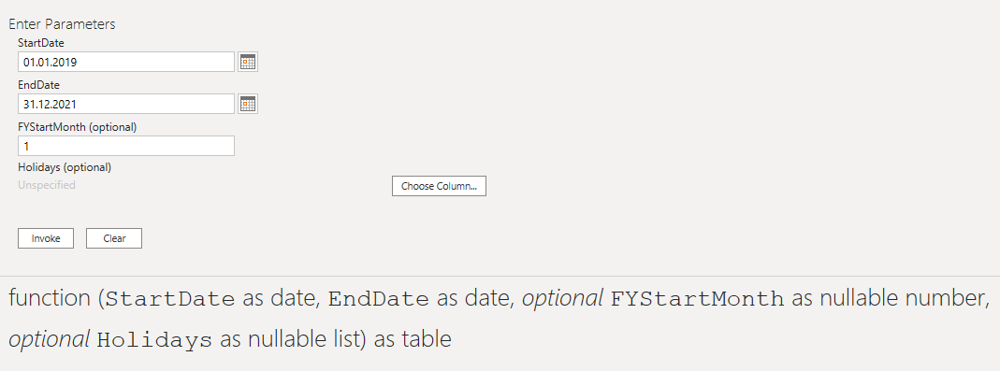

I clicked on the 'Invoke" button and now see that the date table was listed in the side panel and named `invoked_function`: 

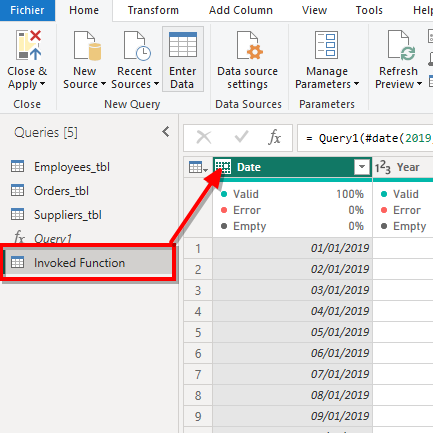

Then I rename the new table to 'Date_tbl'

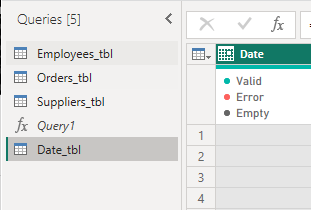

And, I click on 'Close & Apply' to **import** that new data along **with its relationships**: 

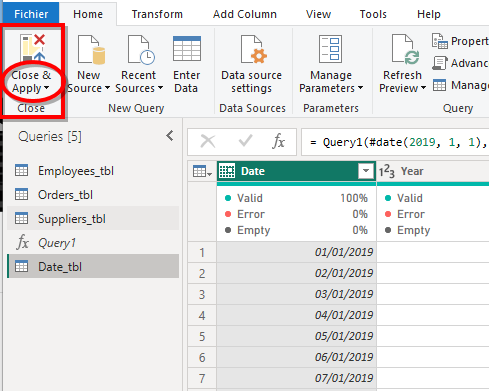

### **Model view**: 
Power BI loads the new data, closes and reopens in a new interface:  

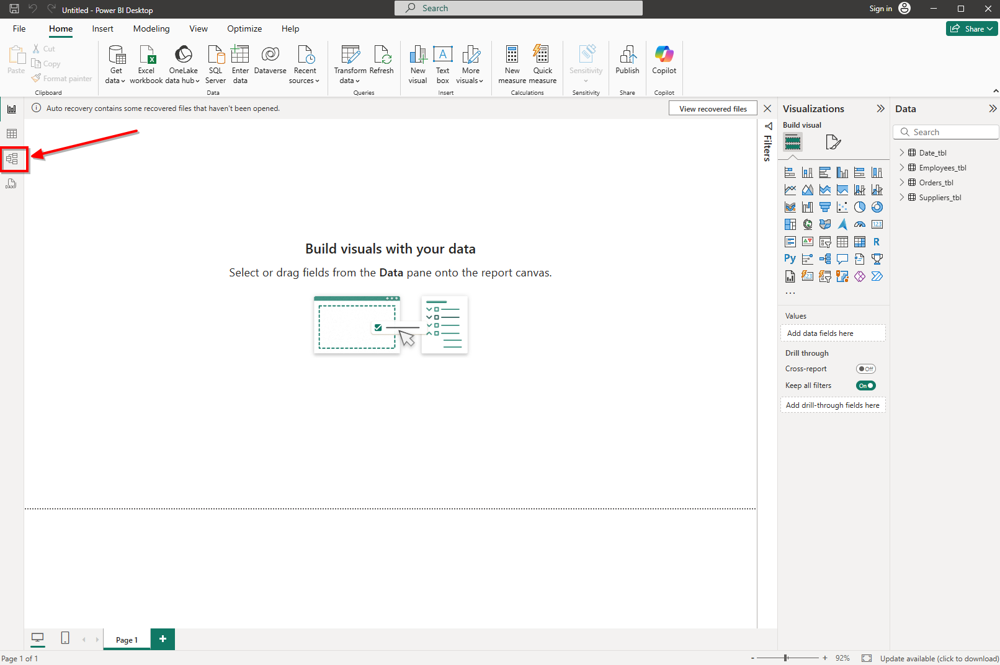

Click on the 'Model View' icon on the left panel.

I now see my schema.  

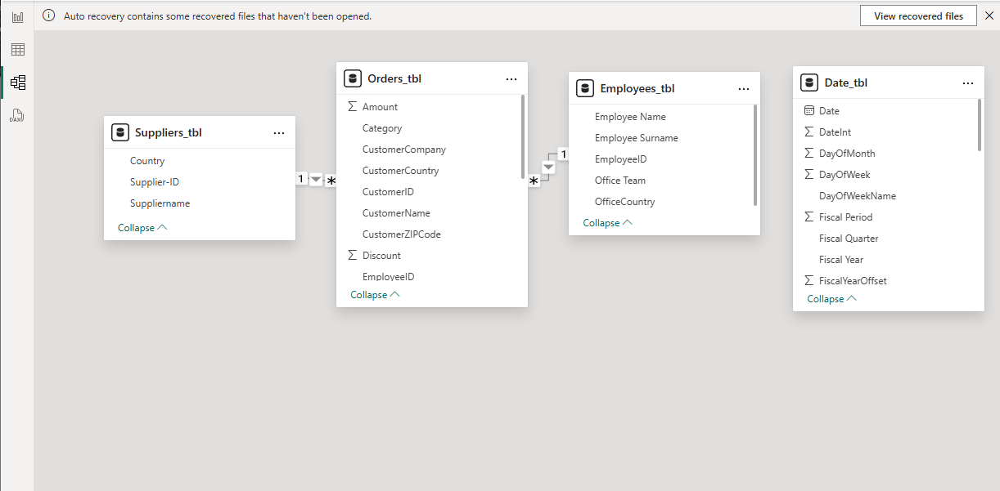

I rearrange the tables and expand them (collapse button at the bottom of each table) so that I can clearly see their relationship lines.  
It appears the new 'Date_tbl' is not connected properly: 

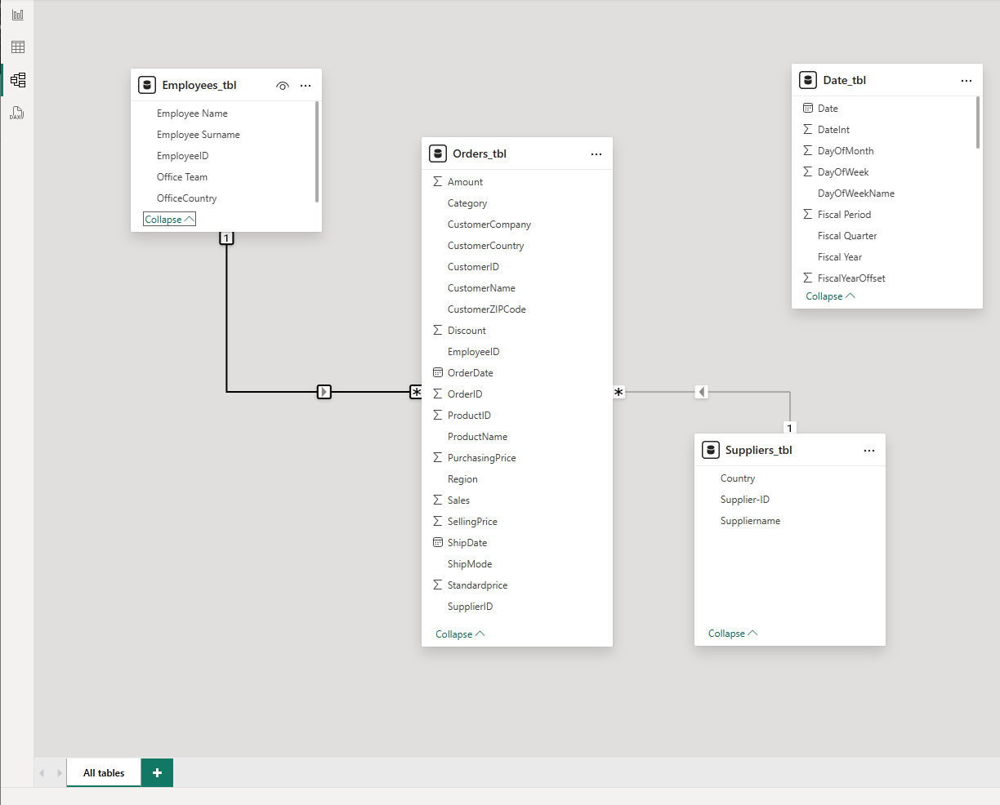

### **New Relationship**:

To connect my new table to the Orders_tbl I need to:
- choose which column will connect to which one. 
  - I know my 'Date" column from 'Date_tbl' is actually the same as the 'OrderDate' column in 'Orders_tbl', so :
- I click on that 'Date' column 
- and drag it to the 'OrderDate' column 
- and drop it in there to create my relationship: 

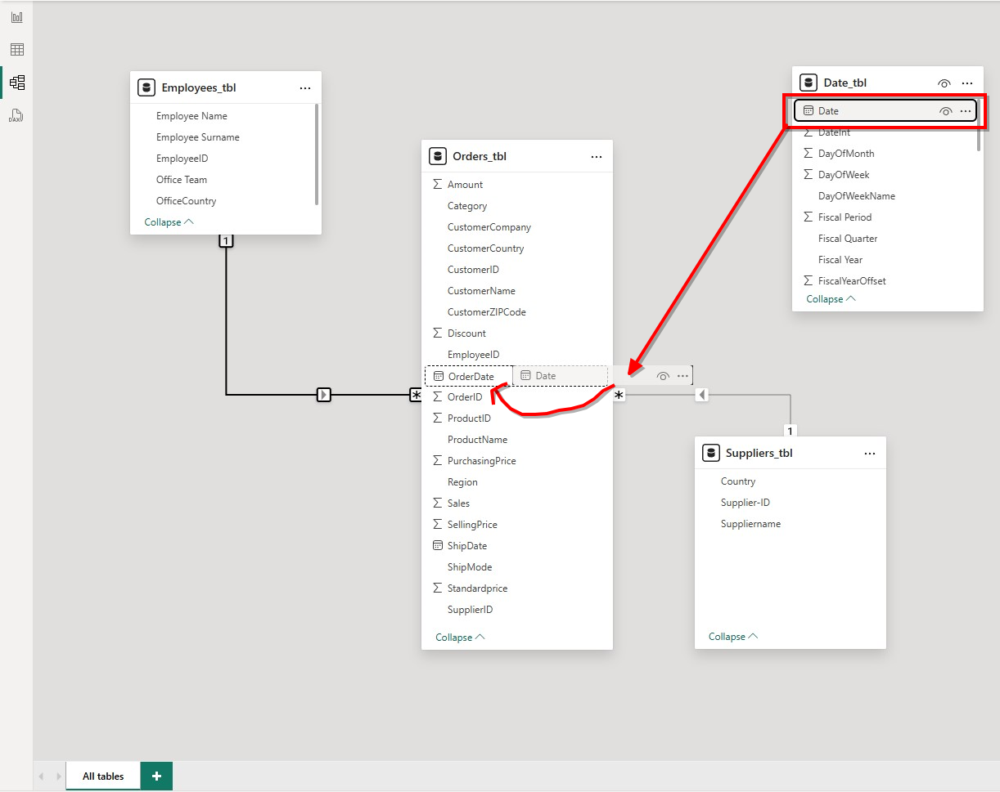

This prompt appears summing up the relationship. The tables and columns are correct. It is a 1-to-many relationship, everything is correct, so I just click done:  

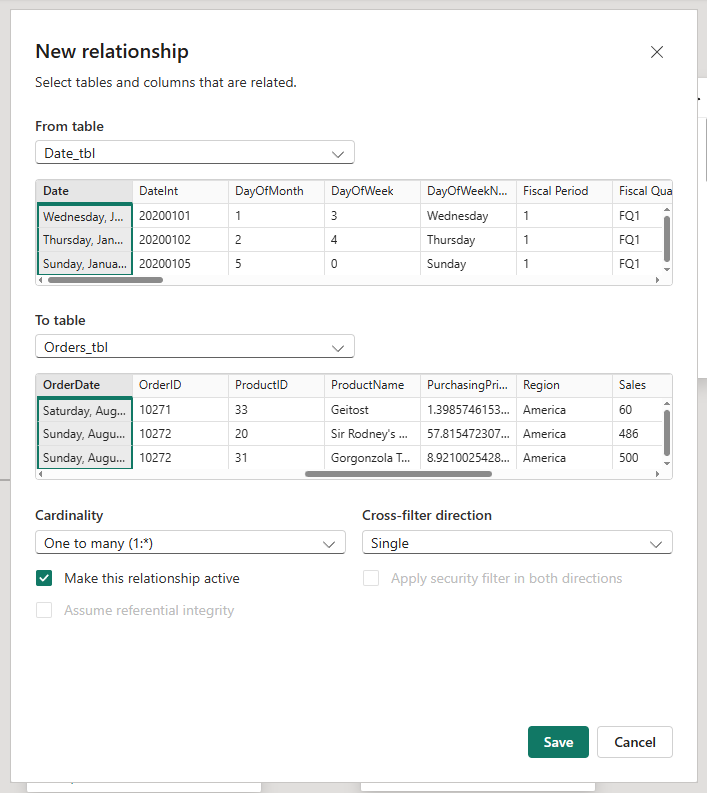

A new line is now representing that new relationship. I can hover over it to see which columns are the keys to that relationship: 

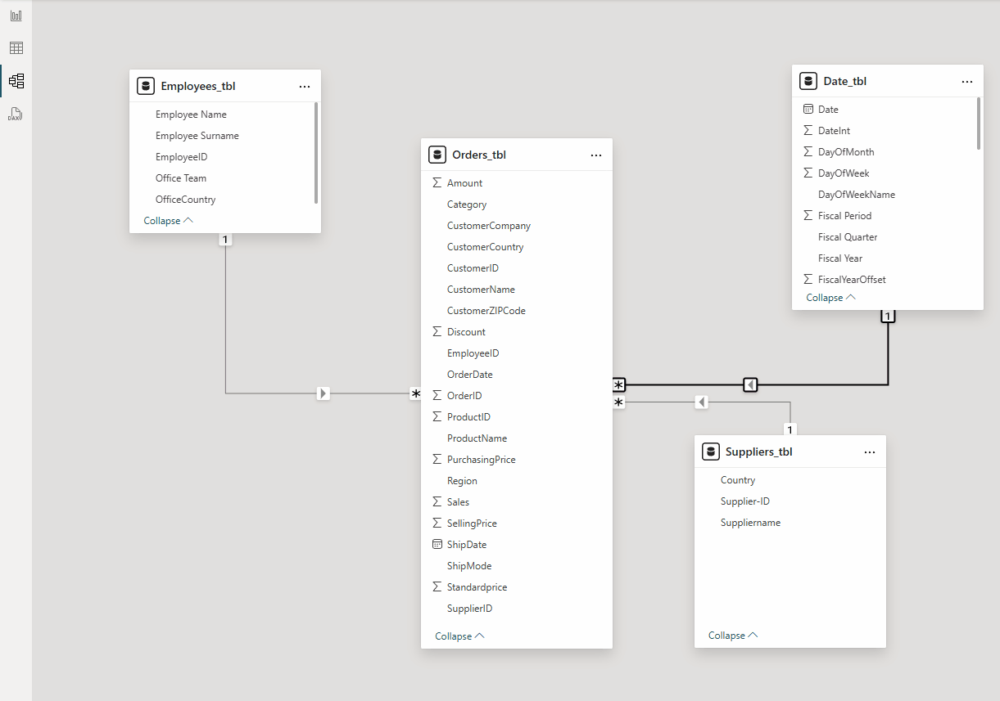

---

## **Setting up Python**: 

I have what I need to start digging the data itself. 
I want to use python and for that I have to use a virtual environment, and install Python.  
I will not go over how to do these steps. 
For this notebook and work I am using Python V.3.12.7. 

Once that is done, I need to tell Power Bi where to find that python exe file:  

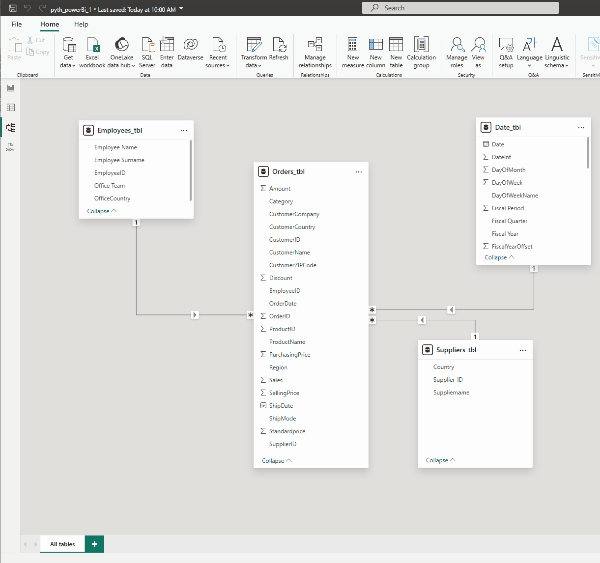


Then save your session. 

### **Python Script Visual**: 

Next is to **enable** the Python Script Visual:  

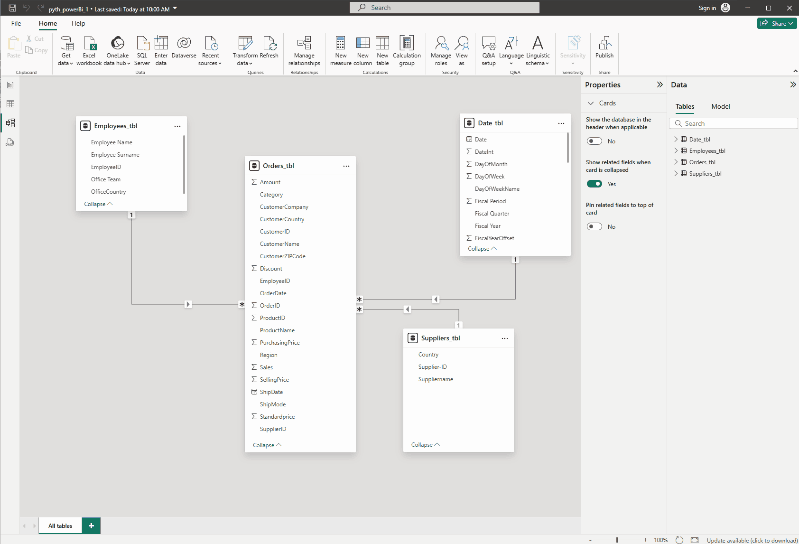


I can now drag and drop columns that I want to work with, I want:
- the sum amount column
- and the sum of sales: 

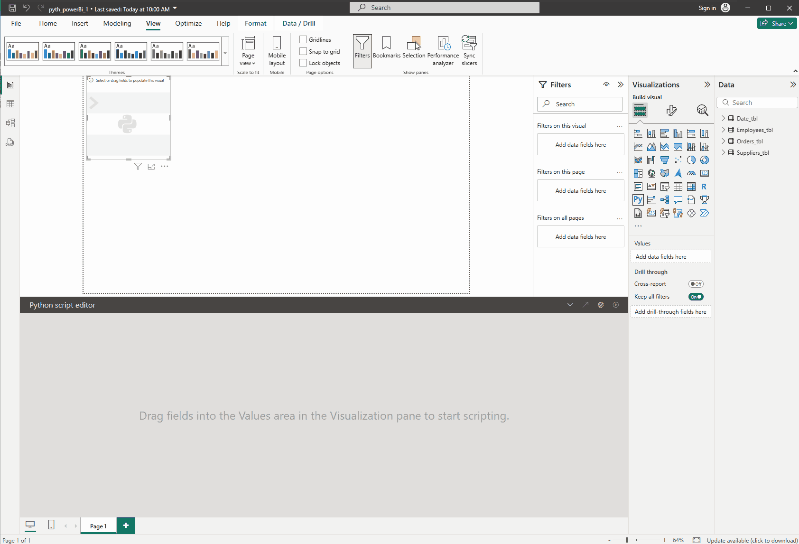





### **Installing/Importing modules**: 

These 2 lines highlighted are  lines that Power BI automatically created for me:
- a dataframe in the variable dataset 
- and dropped all duplicates in it. 

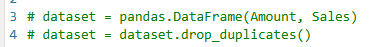

From that same window I can continue writing Python code.  
I want to import the following libraries:
- pandas,
- matplotlib and seaborn

For Power BI to use them they need to be **installed first**. In my case I installed them all already in my anaconda **environment**.   

Once I wrote the code for these imports I click on the run icon: 

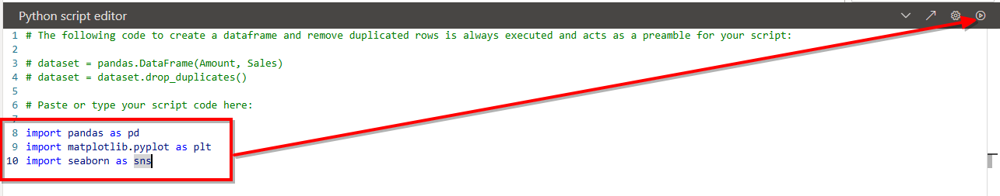


The visualization frame gives me an error message, I click on 'See details' and see that it is ok because I did not create an image yet (a visualization). So I am not missing a module or a library, which means the imports worked. 

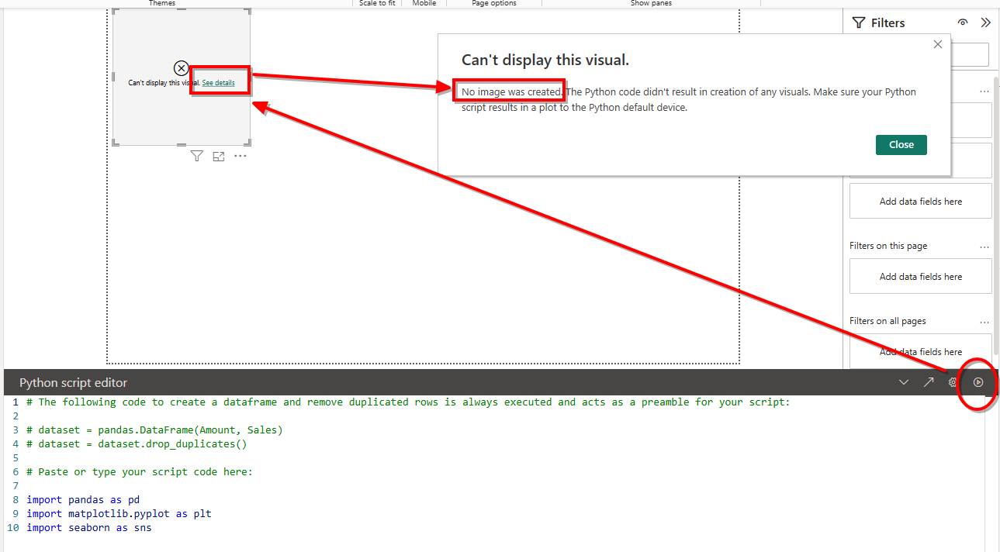

### **joint plot**: 

I can now write the code for a joint plot to see a scatter graph of all the sums of Sales and their amount: 

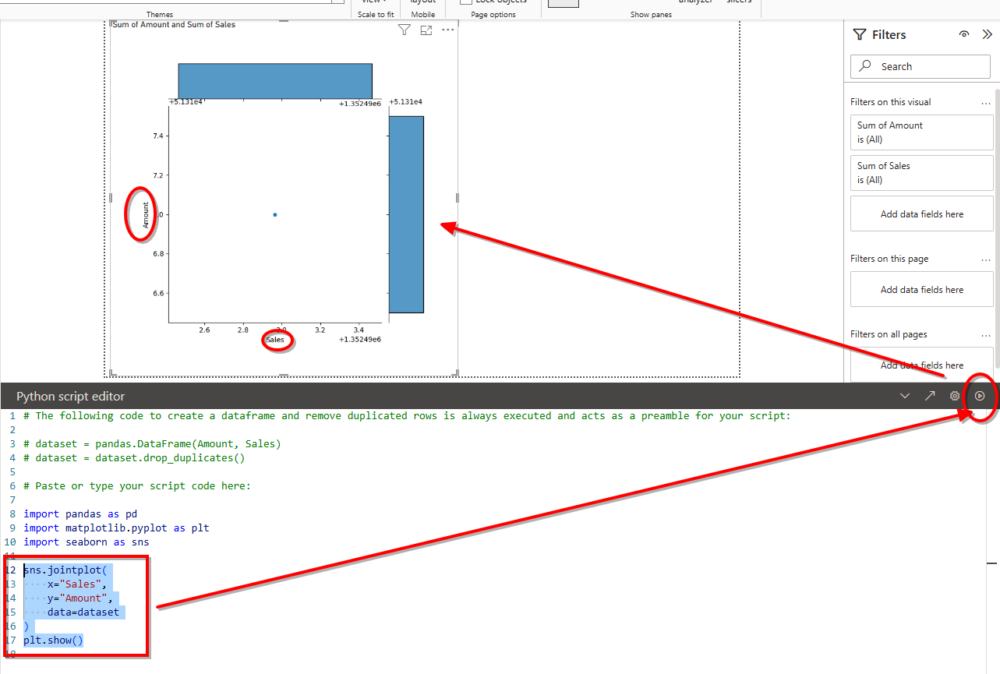

But the rendered image is only showing me one dot, in the middle.  
This is because Power BI summarizes the data by default, which is giving one summed-up data point for both the columns I chose. 

To remove that behavior, I need to:
- check the 'Don't summarize' option 
- from both the columns I added: 

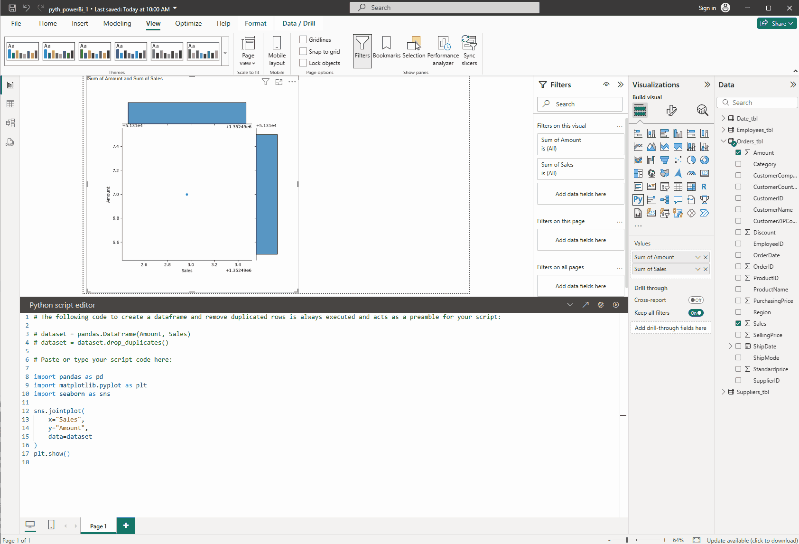


I now see all the data points from these 2 columns. 

### **box plot**: 
I now want to see box plots for each category of product. 
For that I make sure I added the 'Category' column to the Values, and I also make sure to get all data points by no summarizing it. 

Then I write the code for a seaborn boxplot. 
Note that pandas is actually not needed, it is already built-in, so no need to import like I did before. 

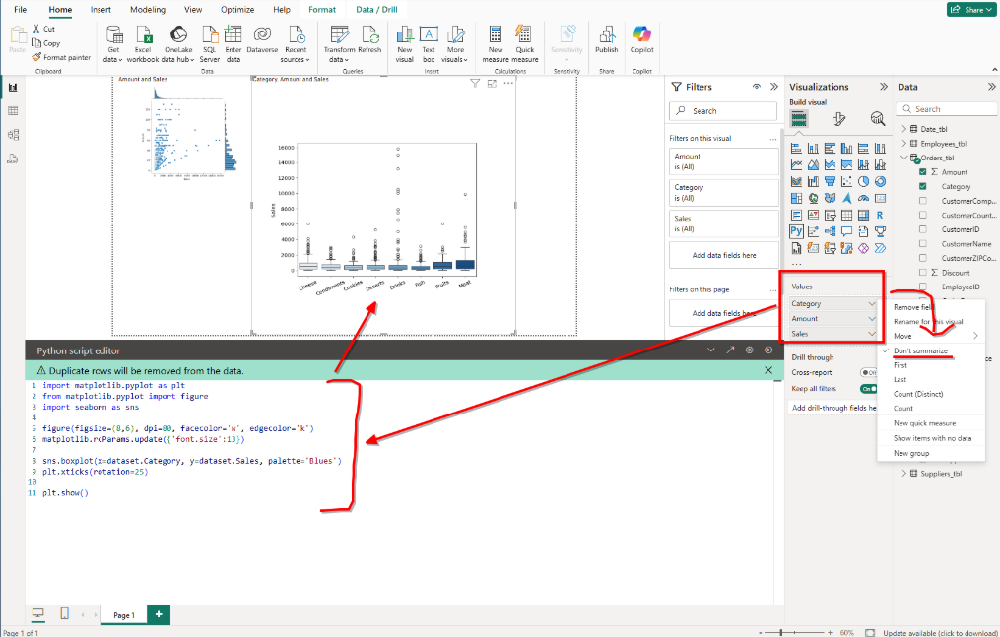

And here's a bigger view of the box plot: 

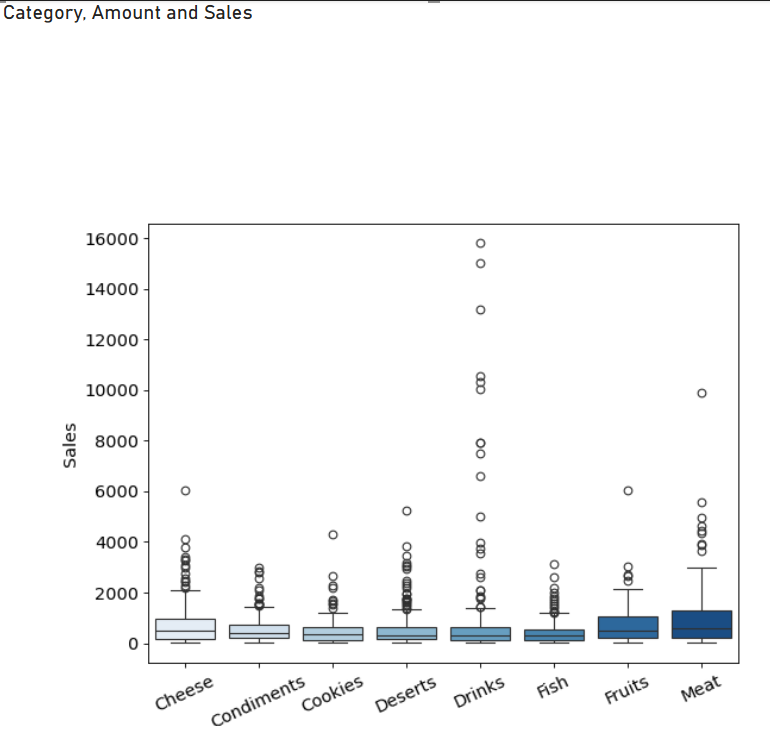

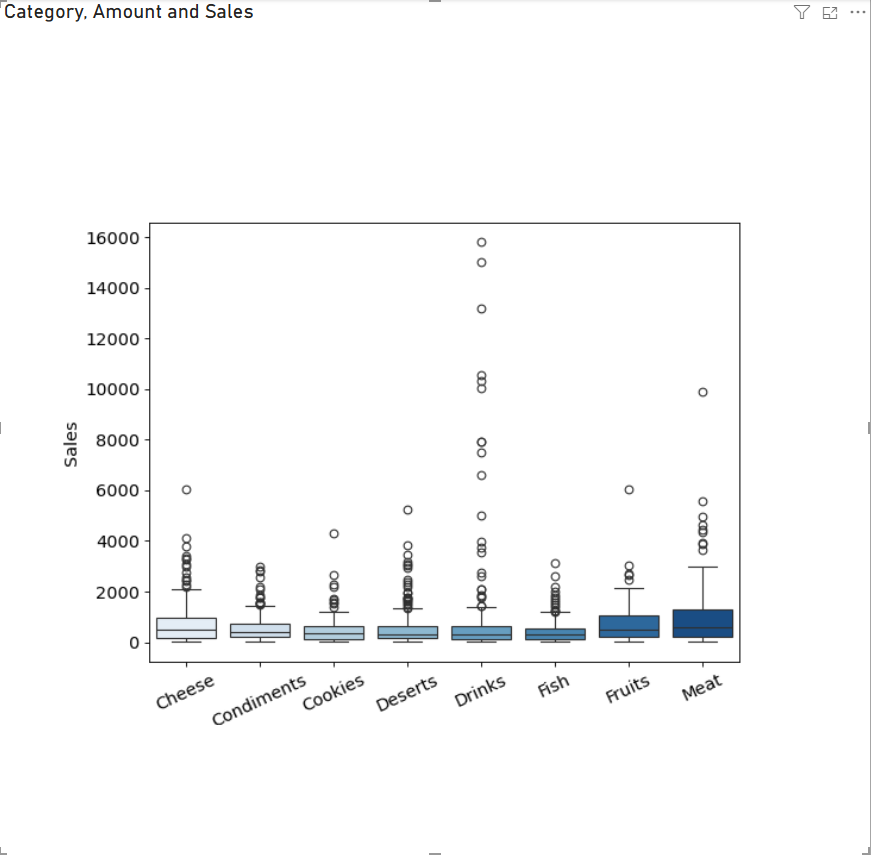
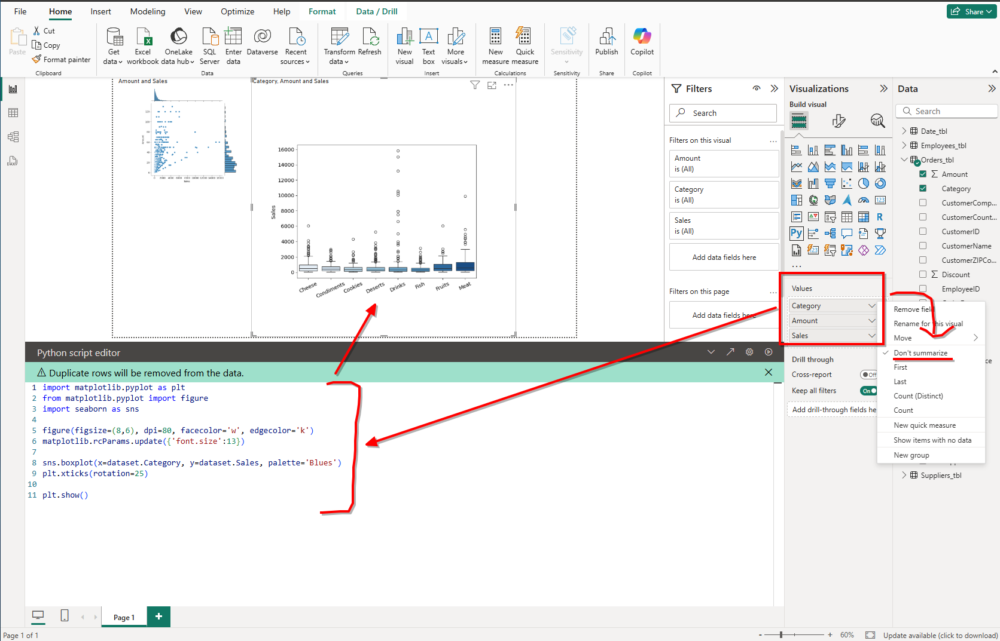

### **Line plot**: 

I do the same but this time I want a seaborn lineplot. 

Note that I added more parameters to fine-tune the look: 
- the position of the legend, 
- the no-show of the fig_reg 
- and the coloring of dots according to the Category (hue): 

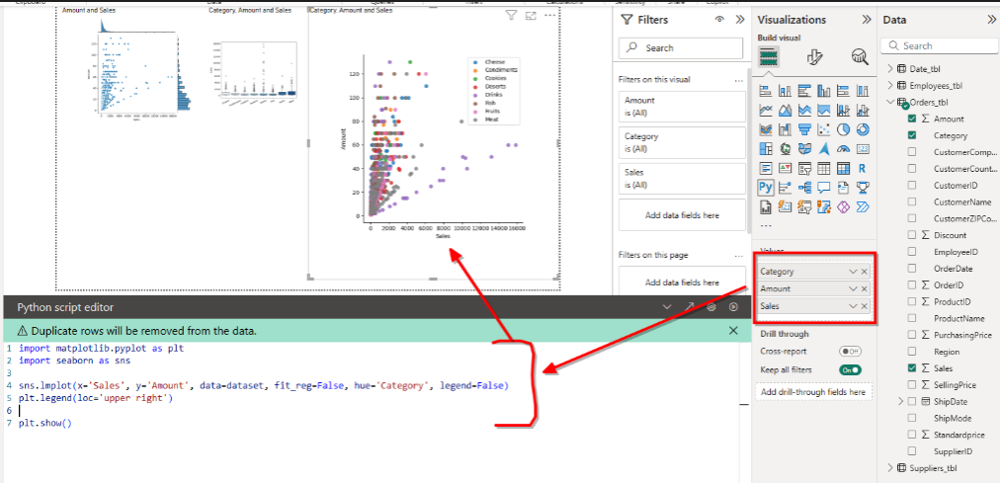
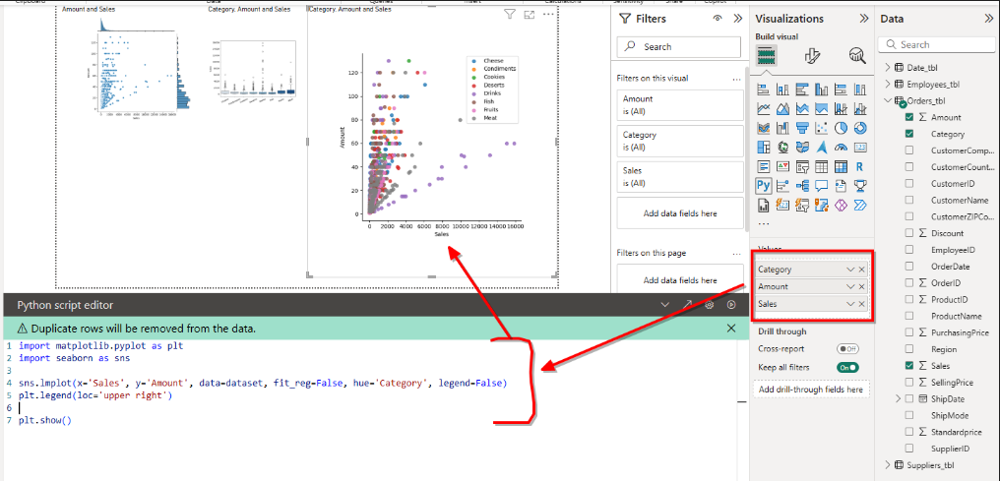
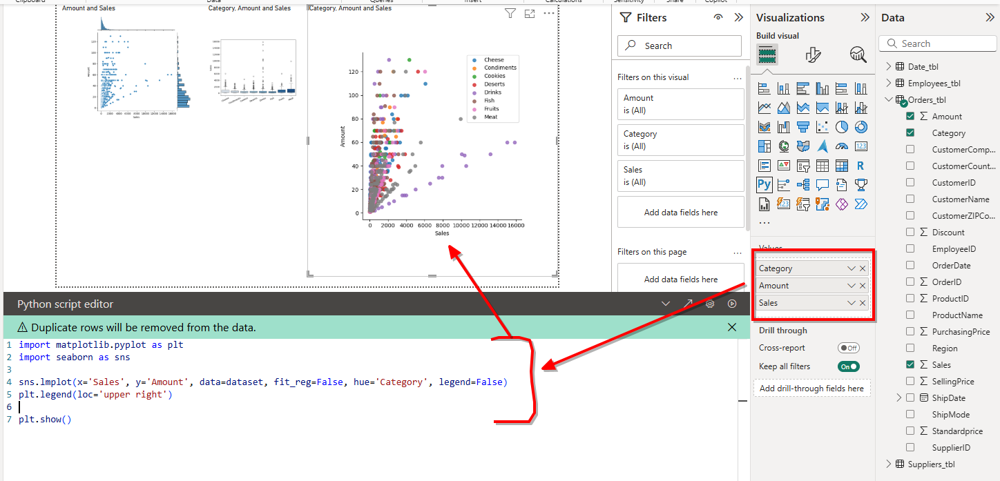

---

## **Dynamic Dashboard with a Slicer (filter)**:

For now these plots are all **static**, meaning there a no way to change any of their parameters and see all of the changes dynamically and accordingly.  

To achieve that **dynamic** feature I can use a **Slicer**:  

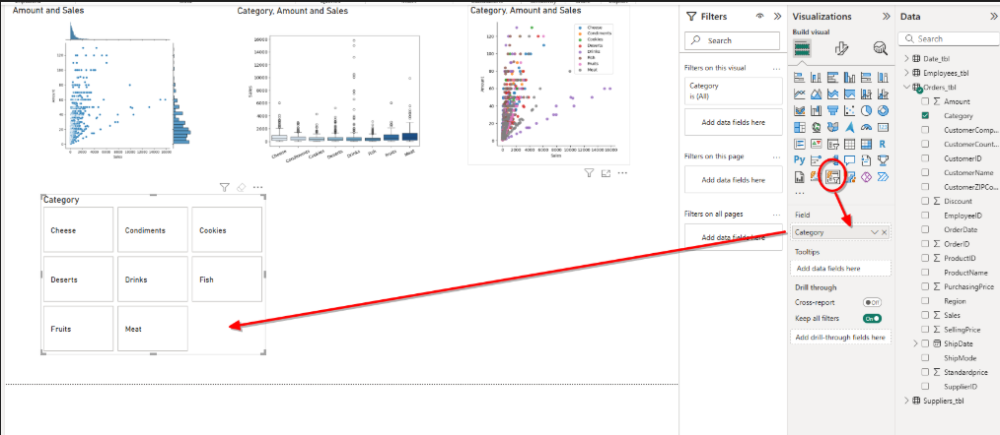
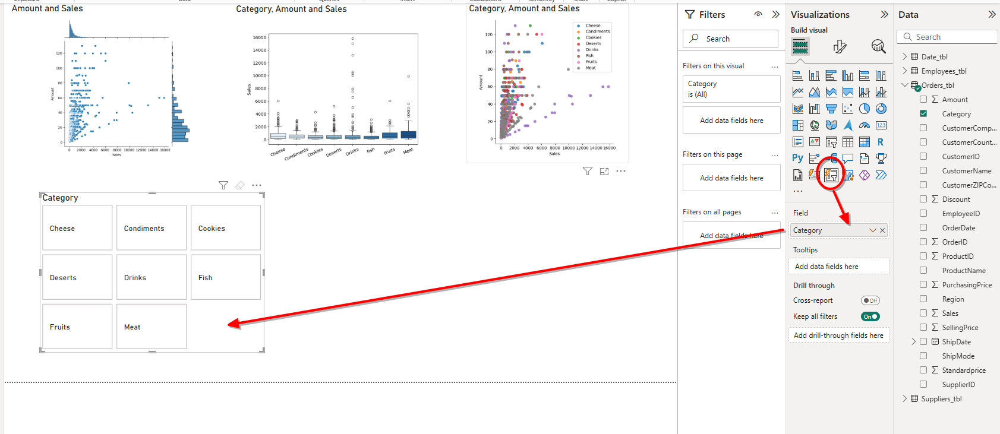

Now, if I select any number of categories in the slicer, all the other plots will change accordingly.  
Let's select drinks, meat and fruits.  

But for that I need to **change the Slicer settings**:  
- turning off the `single select` feature
- and turning on the `select all` option

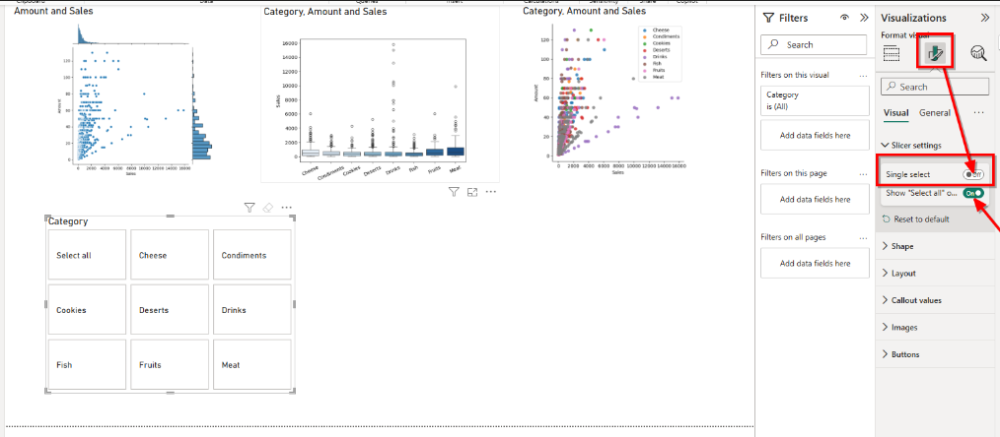
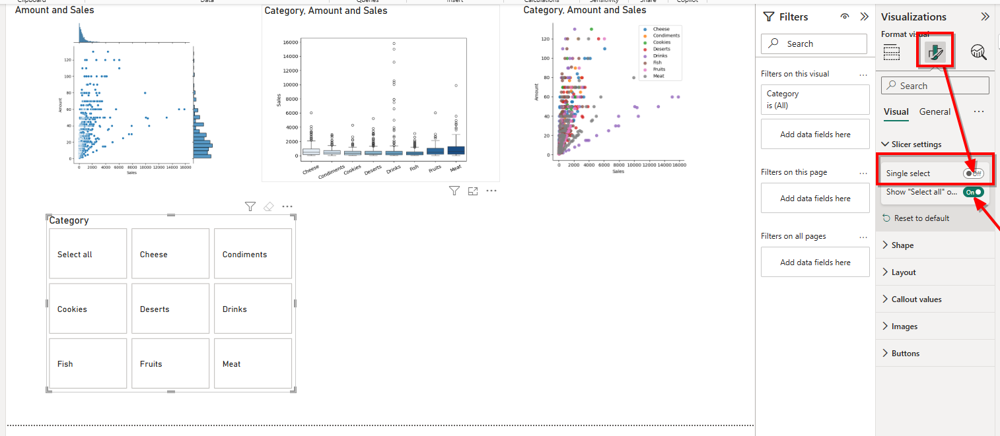

Once I selected the categories I want, the plots change dynamically: 

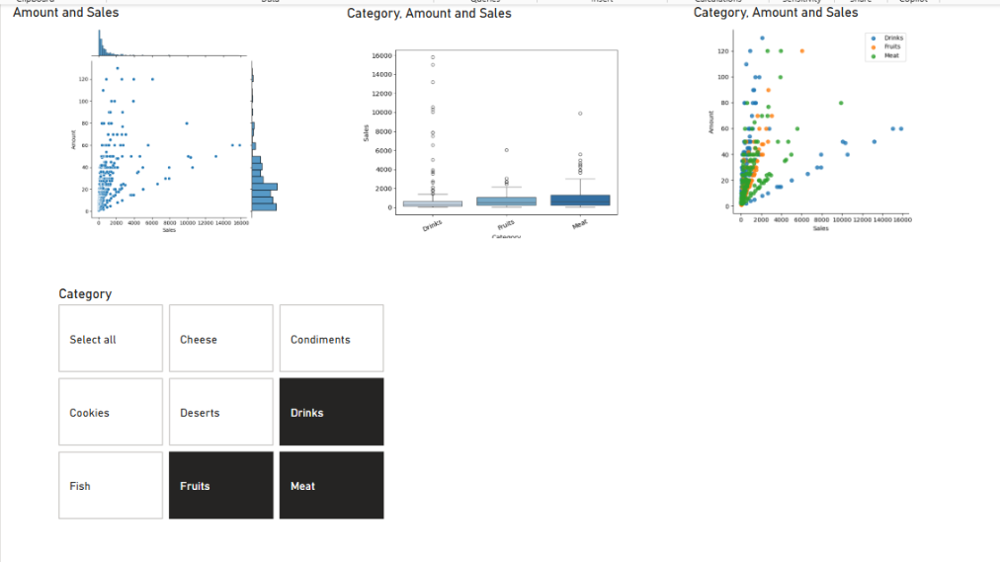
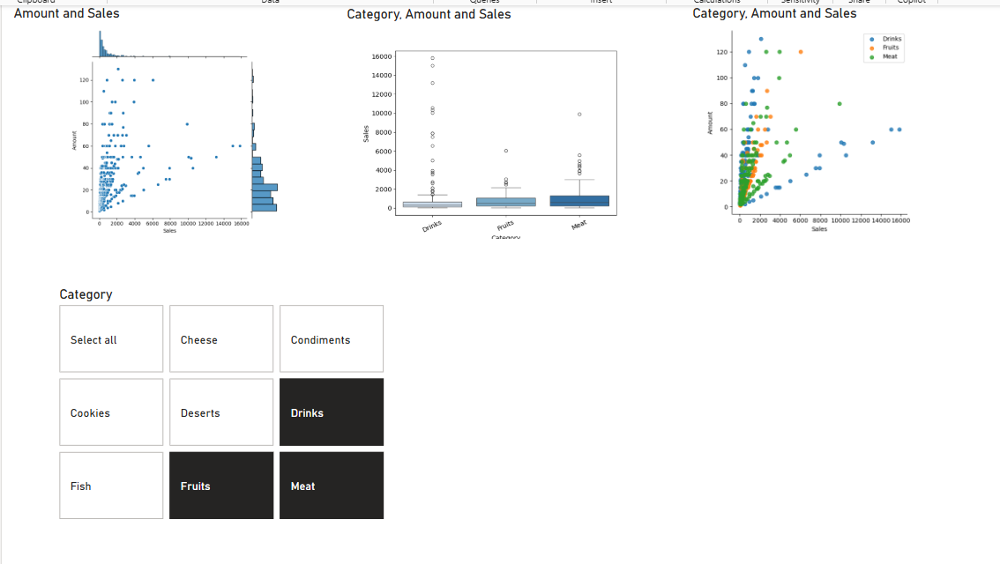

---